In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import seaborn as sns
import re
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
from pathos.multiprocessing import ProcessPool as Pool
import warnings

import dill
dill.settings['recurse'] = True

warnings.simplefilter(action='ignore', category=FutureWarning)
pd.options.mode.chained_assignment = None  # default='warn'
pool = Pool(8)

%load_ext line_profiler


In [2]:
df = pd.read_csv("~/Downloads/draft_data_public.FDN.PremierDraft.csv", nrows=42 * 100)
CARD_VALUES = pd.read_csv("~/Downloads/fdn_card-ratings-2025-01-16.csv")

In [3]:
METRICS = ['alsa_normalized', 'alsa_normalized_squared', 'wr_normalized']
MAIN_METRIC = 'alsa_normalized_squared'
COLORS = ['B', 'W', 'U', 'G', 'R']

In [4]:
def add_metrics():
    CARD_VALUES['alsa_normalized'] = pd.Series(1 - MinMaxScaler().fit_transform(CARD_VALUES['ALSA'].values.reshape(-1, 1)).squeeze())
    CARD_VALUES['alsa_normalized_squared'] = CARD_VALUES['alsa_normalized']**2
    CARD_VALUES['gih_wr'] = CARD_VALUES['GIH WR'].str.extract(r'(.*)%').astype(float)
    CARD_VALUES['gih_wr'] = CARD_VALUES['gih_wr'].fillna(CARD_VALUES['gih_wr'].min())
    CARD_VALUES['wr_normalized'] = pd.Series(StandardScaler().fit_transform(CARD_VALUES['gih_wr'].values.reshape(-1, 1)).squeeze())
    CARD_VALUES['Color'] = CARD_VALUES['Color'].fillna('A')

In [5]:
add_metrics()

In [6]:
df['num_rows'] = df.groupby('draft_id')['draft_id'].transform(lambda x: x.count())
df['completed'] = np.where((df['event_match_losses'] == 3) | (df['event_match_wins'] == 7), 1, 0)
df = df.loc[lambda x: (x['num_rows'] == 42) & (x['completed'] == 1)]
df['pick_number'] = df['pick_number'] + 1
df['pack_number'] = df['pack_number'] + 1

In [7]:
def _get_card_values(row, col_type):
    relevant_data = row.loc[
        lambda y: y.index.str.startswith(col_type)
    ].loc[
        lambda y: y > 0
    ]
    relevant_data.index = relevant_data.index.str.extract(rf'{col_type}_(.*)', expand=False)
    all_cards = [
        CARD_VALUES.loc[lambda x: x['Name'] == name]
        for name, num in relevant_data.items()
        for _ in range(num)  
    ]
    if len(all_cards) > 0:
        return pd.concat(all_cards)
    else:
        return pd.DataFrame(columns=['Color'] + METRICS)

In [8]:
def _split_multicolor(cards):
    cards['num_colors'] = cards['Color'].apply(len)
    singlecolor_cards = cards.loc[lambda x: x['num_colors'] == 1]
    multicolor_cards = cards.loc[lambda x: x['num_colors'] > 1]
    multicolor_cards['Color'] = multicolor_cards['Color'].apply(list)
    multicolor_cards = multicolor_cards.explode(column='Color')
    for metric in METRICS:
        multicolor_cards[metric] /= multicolor_cards['num_colors']
    cards = pd.concat((singlecolor_cards, multicolor_cards))
    return cards

In [9]:
def parse_pick(row):
    cards = _get_card_values(row=row, col_type='pack_card')
    cards = _split_multicolor(cards=cards)
    return cards.groupby('Color')[METRICS].max()

In [10]:
def parse_pool(row):
    cards = _get_card_values(row=row, col_type='pool')
    cards = _split_multicolor(cards=cards)
    return cards.groupby('Color')[METRICS].sum()

In [11]:
def compute_stats(row):
    pool_stats = {
        'current_pool_' + '_'.join(k): v
        for k, v in parse_pool(row).stack().to_dict().items()
    }
    pack_stats = {
        'current_pack_' + '_'.join(k): v
        for k, v in parse_pick(row).stack().to_dict().items()
    }
    actual_pick = CARD_VALUES.loc[lambda x: x['Name'] == row['pick']][['Color', 'Rarity'] + METRICS].add_prefix('actual_').T.squeeze()
    return {
        **row[['draft_id', 'rank', 'event_match_wins', 'pack_number', 'pick_number', 'pick_maindeck_rate', 'user_n_games_bucket', 'user_game_win_rate_bucket']].to_dict(),
        **pool_stats,
        **pack_stats,
        **actual_pick.to_dict(),
    }

In [12]:
# data = pd.DataFrame([
#     compute_stats(row)
#     for _, row in df.iterrows()
# ])

data = pd.DataFrame(
    pool.map(compute_stats, [row for _, row in df.iterrows()])
)

In [13]:
pack_cols = [col for col in data.columns if col.startswith('current_pack')]
data = data.join(
    data.loc[
        lambda x: x['pick_number'] > 1
    ].groupby(['draft_id', 'pack_number'], sort=False)[pack_cols].apply(
        lambda x: x.fillna(0).cumsum()
    ).rename(columns=lambda x: re.sub('current_pack', 'open_lane', x)).reset_index(drop=True, level=[0, 1])
)

In [14]:
def compute_pool_value(metric):
    pool_cols = [
        col for col in data.columns
        if 'current_pool' in col and metric in col
    ]
    return data.groupby('draft_id')[pool_cols].transform(max).sum(axis=1)

In [15]:
for metric in METRICS:
    data[f'final_pool_{metric}'] = compute_pool_value(metric=metric)

In [57]:
def compute_current_colors(row, metric):
    pool_cols = [
        col for col in row.index
        if re.match(rf'current_pool_[{"".join(COLORS)}]_{metric}', col)
    ]
    return row[pool_cols].dropna().sort_values(
        ascending=False
    ).iloc[:2].index.str.extract(
        rf'current_pool_(\w)_{metric}', expand=False
    ).tolist()


def extract_options(row, metric):
    rows = []
    current_colors = compute_current_colors(row=row, metric=metric)
    if len(current_colors) == 2:
        best_option_in_current_colors = row.loc[
            lambda x: x.index.str.match(rf'current_pack_[{"".join(current_colors)}]_{metric}')
        ].max()
        current_pool_second_color = row[f'current_pool_{current_colors[-1]}_{metric}']
        open_lane_second_color = row[f'open_lane_{current_colors[-1]}_{metric}']
        actual_color = row['actual_Color']
        for color in [c for c in COLORS if c not in current_colors]:
            best_option_in_other = row[f'current_pack_{color}_{metric}']
            open_lane_in_other = row[f'open_lane_{color}_{metric}']
            if ~np.isnan(best_option_in_other):
                rows.append({
                    **row[
                        [
                            'draft_id',
                            'rank',
                            'event_match_wins',
                            'pack_number',
                            'pick_number',
                            'pick_maindeck_rate',
                            'user_n_games_bucket',
                            'user_game_win_rate_bucket',
                        ] + [f'final_pool_{metric}' for metric in METRICS]
                    ].to_dict(),
                    'best_option_in_colors': best_option_in_current_colors,
                    'current_pool_second_color': current_pool_second_color,
                    'open_lane_second_color': open_lane_second_color,
                    'best_option_in_other': best_option_in_other,
                    'open_lane_in_other': open_lane_in_other,
                    'other_color': color,
                    'switch': int(actual_color == color),
                    'delta_card_value': best_option_in_other - best_option_in_current_colors,
                    'delta_open_lane': open_lane_in_other - open_lane_second_color,
                })
    return rows

In [ ]:
from functools import partial

final_df = pd.DataFrame(
    [
        r
        for rows in pool.map(partial(extract_options, metric=MAIN_METRIC), [row for _, row in data.iterrows()])
        for r in rows
    ]
)

In [62]:
plot_df = final_df.loc[
    lambda x: (x['pick_number'].between(4, 10)) & (x['best_option_in_colors'].notnull())
].fillna(value={'rank': 'unknown'})
plot_df

,draft_id,rank,event_match_wins,pack_number,pick_number,pick_maindeck_rate,user_n_games_bucket,user_game_win_rate_bucket,final_pool_alsa_normalized,final_pool_alsa_normalized_squared,final_pool_wr_normalized,best_option_in_colors,current_pool_second_color,open_lane_second_color,best_option_in_other,open_lane_in_other,other_color,switch,delta_card_value,delta_open_lane
0,f4060a8ab54f4a02b0916f3b0d984141,unknown,0,1,7,1.0,100,0.54,22.708432,7.765613,3.383733,0.255347,0.568500,1.002838,0.080228,1.501266,B,0,-0.175120,0.498428
1,f4060a8ab54f4a02b0916f3b0d984141,unknown,0,1,8,0.5,100,0.54,22.708432,7.765613,3.383733,0.000000,0.651769,1.002838,0.417673,1.918940,B,0,0.417673,0.916101
2,f4060a8ab54f4a02b0916f3b0d984141,unknown,0,1,8,0.5,100,0.54,22.708432,7.765613,3.383733,0.000000,0.651769,1.002838,0.101009,1.484274,W,0,0.101009,0.481436
3,f4060a8ab54f4a02b0916f3b0d984141,unknown,0,1,8,0.5,100,0.54,22.708432,7.765613,3.383733,0.000000,0.651769,1.002838,0.294364,1.419504,G,0,0.294364,0.416665
4,f4060a8ab54f4a02b0916f3b0d984141,unknown,0,1,9,1.0,100,0.54,22.708432,7.765613,3.383733,0.215385,0.651769,1.218223,0.536868,2.455808,B,0,0.321483,1.237585
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
740756,18656f6efc044152ba5892f85e136d4b,silver,4,3,8,1.0,100,0.60,27.858880,9.691327,7.644142,0.479998,1.571262,0.955914,0.123246,1.248531,G,0,-0.356753,0.292618
740757,18656f6efc044152ba5892f85e136d4b,silver,4,3,9,1.0,100,0.60,27.858880,9.691327,7.644142,0.095179,1.571262,0.991070,0.248672,2.051616,W,0,0.153493,1.060546
740758,18656f6efc044152ba5892f85e136d4b,silver,4,3,9,1.0,100,0.60,27.858880,9.691327,7.644142,0.095179,1.571262,0.991070,0.262111,1.155226,U,0,0.166933,0.164156
740759,18656f6efc044152ba5892f85e136d4b,silver,4,3,10,1.0,100,0.60,27.858880,9.691327,7.644142,0.108760,1.571262,0.991070,0.101009,2.152625,W,0,-0.007751,1.161555


In [55]:
from marginaleffects import comparisons, datagrid

OUTCOMES = ['event_match_wins', 'final_pool_alsa_normalized_squared', 'final_pool_wr_normalized']
CATEGORICAL_VARS = ['rank', 'pack_number']
user_controls = 'C(rank) + user_n_games_bucket + user_game_win_rate_bucket'
decision_controls = 'pick_number + current_pool_second_color + delta_card_value + delta_open_lane'

def create_poly_func(variable):
    return f'{variable} + np.power({variable}, 2) + np.power({variable}, 3)'


RES_PARAMS = [
    {
        'title': 'Pick Number',
        'x': 'pick_number',
        'data': plot_df.loc[lambda x: x['pack_number'] == 1],
        'formula_rhs': f'{user_controls} + switch*({create_poly_func("pick_number")})*({decision_controls})',
        'datagrid_params': {
            'pick_number': plot_df['pick_number'].unique(),
            **{
                cat_var: plot_df[cat_var].unique()
                for cat_var in CATEGORICAL_VARS
            },
        },
    },
    {
        'title': 'Delta Card Value',
        'x': 'delta_card_value',
        'data': plot_df.loc[lambda x: x['pack_number'] == 1],
        'formula_rhs': f'{user_controls} + switch*({create_poly_func("delta_card_value")})*({decision_controls})',
        'datagrid_params': {
            'delta_card_value': np.linspace(-0.5, 0.5, 21),
            **{
                cat_var: plot_df[cat_var].unique()
                for cat_var in CATEGORICAL_VARS
            },
        },
    },
    {
        'title': 'Delta Open Lane',
        'x': 'delta_open_lane',
        'data': plot_df.loc[lambda x: x['pack_number'] == 1],
        'formula_rhs': f'{user_controls} + switch*({create_poly_func("delta_open_lane")})*({decision_controls})',
        'datagrid_params': {
            'delta_open_lane': np.linspace(-1, 1, 21),
            **{
                cat_var: plot_df[cat_var].unique()
                for cat_var in CATEGORICAL_VARS
            },
        },
    },
]

def create_plot_data():
    fig, ax = plt.subplots(len(RES_PARAMS), len(OUTCOMES), figsize=(5 * len(OUTCOMES), 5 * len(RES_PARAMS)), squeeze=False)
    for i, params in enumerate(RES_PARAMS):
        for j, outcome in enumerate(OUTCOMES):
            res = smf.ols(f"{outcome} ~ {params['formula_rhs']}", data=params['data']).fit()
            dg = datagrid(
                model=res,
                grid_type='mean_or_mode',
                switch=[0, 1],
                **params['datagrid_params'],
            )
            if params.get('hue'):
                results = comparisons(res, variables='switch', by=[params['x'], params['hue']], newdata=dg).to_pandas()
                for hue_value, group in results.groupby(params['hue']):
                    ax[i, j].plot(group[params['x']], group['estimate'], label=f'{params["hue"]} {hue_value}')
                    ax[i, j].fill_between(group[params['x']], group['conf_low'], group['conf_high'], alpha=0.2)
                ax[i, -1].legend()
            else:
                results = comparisons(res, variables='switch', by=params['x'], newdata=dg).to_pandas()
                ax[i, j].plot(results[params['x']], results['estimate'])
                ax[i, j].fill_between(results[params['x']], results['conf_low'], results['conf_high'], alpha=0.2)
            ax[i, j].set_title(outcome)
        ax[i, 0].set_ylabel(params['title'])

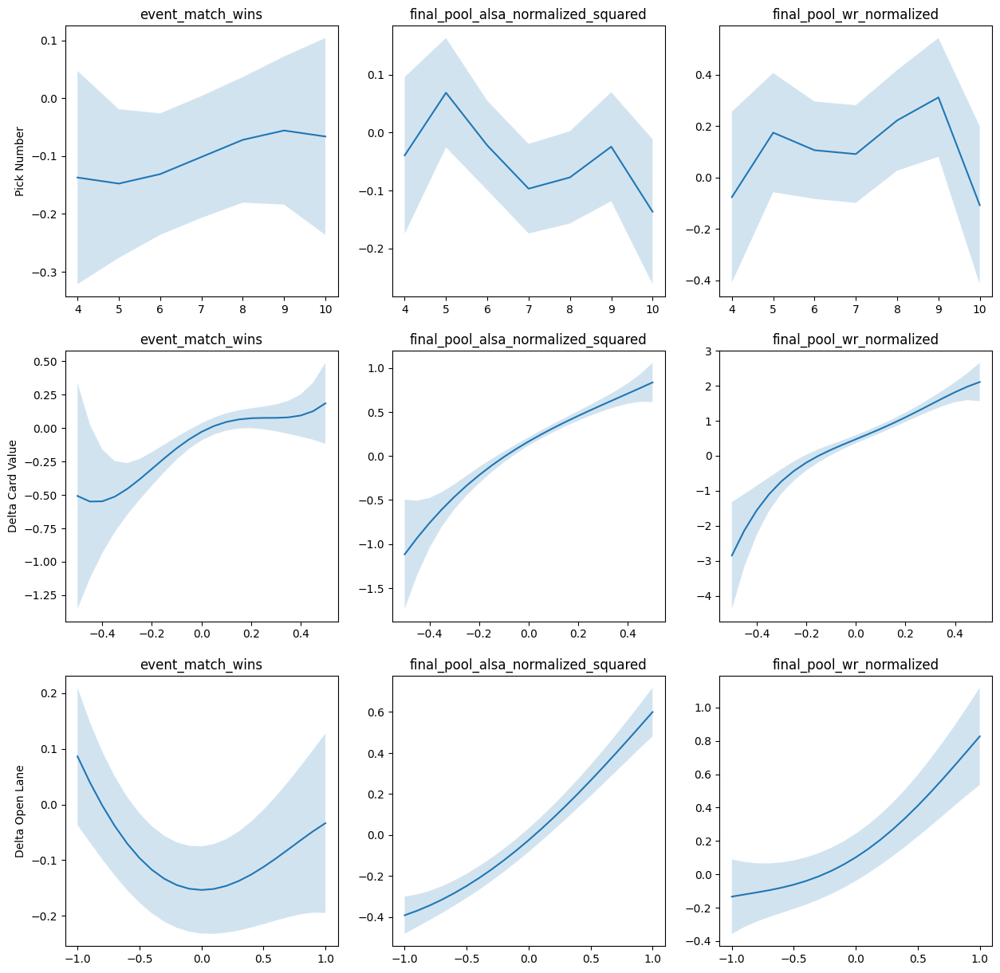

In [56]:
create_plot_data()

# Pack 1 vs 3 Scatterplot

In [207]:
def parse_pack(rows, pack_num):
    picks = rows.loc[lambda x: x['pack_number'] == pack_num]
    metrics = pd.concat([
        parse_pick(row=row)
        for _, row in picks.iterrows()
        if row['pick_number'] > 0
    ])
    return metrics.groupby('Color').sum()

In [208]:
pack_1_3 = pd.concat([
    parse_pack(
        df.loc[lambda x: x['draft_id'] == draft_id], pack_num=0
    ).merge(
        parse_pack(
            df.loc[lambda x: x['draft_id'] == draft_id], pack_num=2
        ),
        on='Color',
        suffixes=('_1', '_3')
    )
    for draft_id in df['draft_id'].unique()
])

/var/folders/w_/xtpmhmfx3y9c4g3ccm9rkl3r0000gn/T/ipykernel_71128/1161629060.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cards['num_colors'] = cards['Color'].apply(len)
/var/folders/w_/xtpmhmfx3y9c4g3ccm9rkl3r0000gn/T/ipykernel_71128/1161629060.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multicolor_cards['Color'] = multicolor_cards['Color'].apply(list)
/var/folders/w_/xtpmhmfx3y9c4g3ccm9rkl3r0000gn/T/ipykernel_71128/1161629060.py:2: SettingWithCopyWarning: 
A value is trying to be set on a co

<AxesSubplot: xlabel='alsa_normalized_squared_1', ylabel='alsa_normalized_squared_3'>

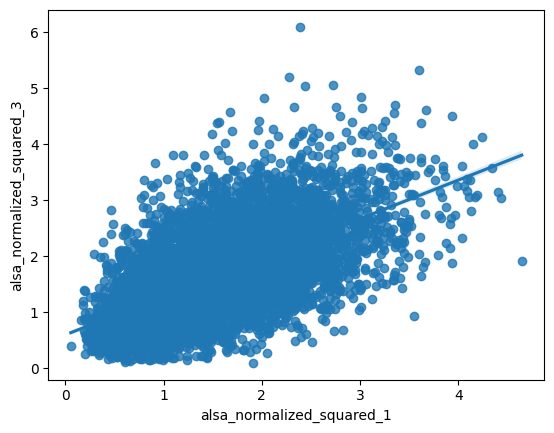

In [210]:
sns.regplot(
    data=pack_1_3,
    x='alsa_normalized_squared_1',
    y='alsa_normalized_squared_3',
)